## US Natality 

<a href='https://bigquery.cloud.google.com/table/bigquery-public-data:samples.natality?pli=1'>data</a>

## basic EDA

In [2]:
import pandas as pd

natality = pd.read_csv('us_new_born_2million.csv')
natality.head()

,weight_pounds,state,year,month,child_race,plurality,mother_race,mother_age,cigarette_use,cigarettes_per_day,alcohol_use,drinks_per_week,father_race,father_age,is_male,gestation_weeks
0,7.813183,GA,2003,9,NaN,1,1.0,34,False,NaN,False,NaN,1.0,39,False,39
1,8.000575,GA,2003,1,NaN,1,1.0,37,True,15.0,True,0.0,1.0,31,True,41
2,7.251004,GA,2003,12,NaN,1,1.0,30,False,NaN,False,NaN,1.0,38,False,40
3,9.568062,GA,2003,4,NaN,1,7.0,39,False,NaN,False,NaN,1.0,39,True,40
4,7.187070,GA,2004,2,NaN,1,1.0,38,False,NaN,False,NaN,1.0,39,True,40


In [3]:
natality.shape

(1998246, 16)

In [4]:
natality.groupby(['year','state']).size().nsmallest(10)

year  state
2004  VT       1300
2003  VT       1380
      WY       1493
2004  WY       1656
2003  AK       2114
2004  AK       2139
      ND       2250
2003  ND       2348
2004  DE       2558
2003  DE       2647
dtype: int64

In [5]:
df = natality.query('year == 2003 & state == "DE"')
df.shape

(2647, 16)

In [6]:
df.describe()

,weight_pounds,year,month,child_race,plurality,mother_race,mother_age,cigarettes_per_day,drinks_per_week,father_race,father_age,gestation_weeks
count,2647.000000,2647.0,2647.000000,0.0,2647.000000,2647.000000,2647.000000,254.000000,254.000000,2647.000000,2647.000000,2647.000000
mean,7.209411,2003.0,6.463166,NaN,1.034001,3.599547,26.684171,9.267717,0.051181,37.072157,53.806196,38.570079
std,1.340025,0.0,3.403799,NaN,0.189422,13.150612,6.167171,6.671808,0.368388,46.741547,32.592421,2.471359
min,0.626113,2003.0,1.000000,NaN,1.000000,1.000000,14.000000,1.000000,0.000000,1.000000,16.000000,21.000000
25%,6.563162,2003.0,4.000000,NaN,1.000000,1.000000,21.000000,4.000000,0.000000,1.000000,29.000000,38.000000
50%,7.312733,2003.0,6.000000,NaN,1.000000,1.000000,27.000000,10.000000,0.000000,1.000000,35.000000,39.000000
75%,8.062305,2003.0,9.000000,NaN,1.000000,2.000000,31.000000,10.000000,0.000000,99.000000,99.000000,40.000000
max,11.250189,2003.0,12.000000,NaN,3.000000,78.000000,44.000000,40.000000,4.000000,99.000000,99.000000,47.000000


## interactive plot

- install nodejs
- pip install ipywidgets
- notebook : jupyter nbextension enable --py widgetsnbextension
- lab : jupyter labextension install @jupyter-widgets/jupyterlab-manager
- pip install plotly==3.3.0
- pip install cufflinks==0.14.5
- conda install -c conda-forge jupyterlab-plotly-extension
- jupyter lab build

In [7]:
import matplotlib.pyplot as plt
%matplotlib inline

import ipywidgets as widgets
from ipywidgets import interact, interact_manual

import plotly.plotly as py
import plotly.graph_objs as go
from plotly.offline import iplot, init_notebook_mode
init_notebook_mode(connected=True)

import cufflinks as cf
cf.go_offline(connected=True)
cf.set_config_file(colorscale='plotly', world_readable=True)

# Extra options
pd.options.display.max_rows = 30
pd.options.display.max_columns = 25

# Show all code cells outputs
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

### 1. 컬럼별 분포 확인

- Weight Pound : 출산 몸무게 
- Plurality: 1명, 쌍둥이, 세쌍둘이 등
- Mother Race / Father Race : 부모의 인종
- Mother Age / Father Age : 부모의 나의
- Gestation Week : 임신기간

In [8]:
@interact
def histogram(x=list(df.select_dtypes('number').columns),
                 theme=list(cf.themes.THEMES.keys()), 
                 colorscale=list(cf.colors._scales_names.keys())):

    df[x].iplot(kind='histogram', xTitle=x.title(), theme=theme, colorscale=colorscale)
    print(df[x].describe())


interactive(children=(Dropdown(description='x', options=('weight_pounds', 'year', 'month', 'child_race', 'plur…

### 2. 이상치 처리

In [8]:
old_father = df.query('father_age > 90')
old_father.father_age.head(10)

5914     99
6423     99
10880    99
11125    99
12935    99
12936    99
12937    99
24974    99
24975    99
25964    99
Name: father_age, dtype: int64

In [9]:
df.query('father_age == 99').shape

(889, 16)

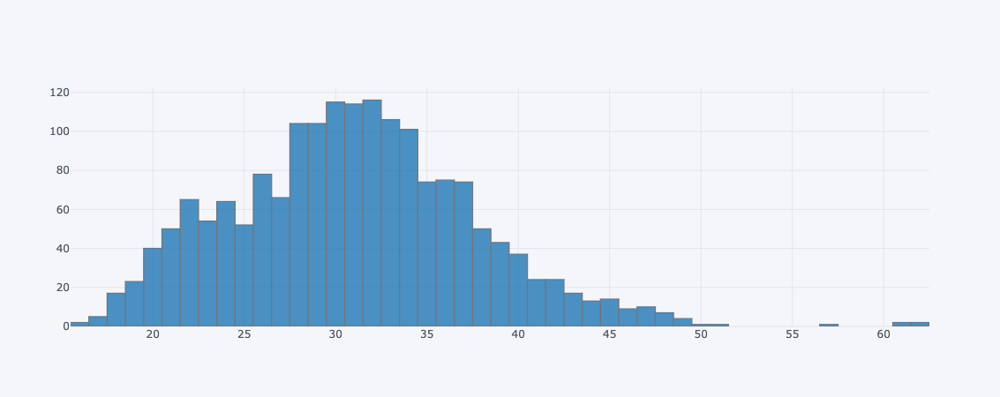

In [9]:
# 99를 NA로 변경
import numpy as np
df.loc[df['father_age'] == 99, 'father_age'] = np.nan

df.father_age.iplot(kind='histogram')

### 3. 상관관계

In [10]:
@interact
def scatter(x=list(df.select_dtypes('number').columns), 
                 y=list(df.select_dtypes('number').columns)[1:],
                 theme=list(cf.themes.THEMES.keys()), 
                 colorscale=list(cf.colors._scales_names.keys())):
    
    df.iplot(kind='scatter', x=x, y=y, mode='markers', 
             xTitle=x.title(), yTitle=y.title(), 
             title=f'{y.title()} vs {x.title()}',
            theme=theme, colorscale=colorscale)

interactive(children=(Dropdown(description='x', options=('weight_pounds', 'year', 'month', 'child_race', 'plur…

#### - 인종별 상관관계

In [16]:
races = 
@interact
def scatter(x=['fater_age', 'mother_age'], y=['gestation_weeks']):
    
    df.iplot(kind='scatter', x=x, y=y, mode='markers', 
             xTitle=x.title(), yTitle=y.title(), 
             title=f'{y.title()} vs {x.title()}')

In [61]:
racename = {1:'White', 
            2 : 'Black',
            3 : 'American Indian',
            4 : 'Chinese',
            5 : 'Japanese',
            6 : 'Hawaiian',
            7 : 'Filipino',
            9 : 'Unknown/Other',
            18: 'Asian Indian',
            28: 'Korean',
            39: 'Samoan',
            48: 'Vietnamese', 
            0 : 'NA'}
df.father_race = df.father_race.fillna(0).astype('int32')
df.mother_race = df.mother_race.fillna(0).astype('int32')
races = set(df['mother_race'].unique().tolist() + df['father_race'].unique().tolist())
races 

{0, 1, 2, 3, 4, 5, 6, 7, 78, 99}

In [77]:
# 78, 99 정의되지 않음
df.loc[(df['mother_race'] == 78) | (df['mother_race'] == 99), 'mother_race'] = 0
df.loc[(df['father_race'] == 78) | (df['father_race'] == 99), 'father_race'] = 0

races = set(df['mother_race'].unique().tolist() + df['father_race'].unique().tolist())
racelist = [racename[x] for x in races]
racelist

['NA',
 'White',
 'Black',
 'American Indian',
 'Chinese',
 'Japanese',
 'Hawaiian',
 'Filipino']

#### - 상관 계수

In [94]:
@interact

def corr(x=list(df.select_dtypes('number').columns), 
                 y=list(df.select_dtypes('number').columns)[1:]):
    
    print("correlation : %s" % str(df[x].corr(df[y])))

interactive(children=(Dropdown(description='x', options=('weight_pounds', 'year', 'month', 'child_race', 'plur…

## Seaborn plot

### 1. pair plot

Text(0.5, 1.0, 'Pair Plot')

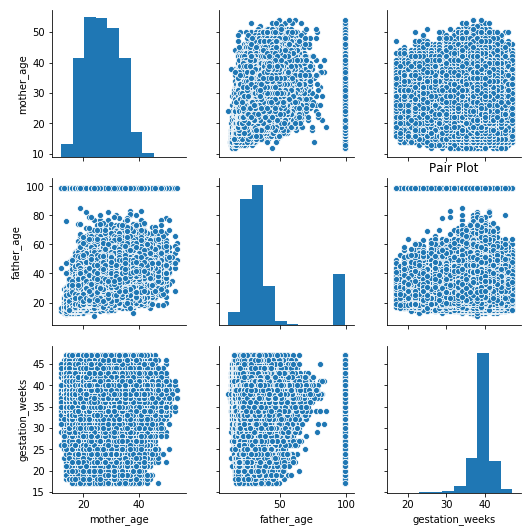

In [146]:
import seaborn as sns
from matplotlib import pyplot as plt 

sns.pairplot(df[['mother_age', 'father_age', 'gestation_weeks']])
plt.title("Pair Plot")
plt.show()

### 2. Regression Plot

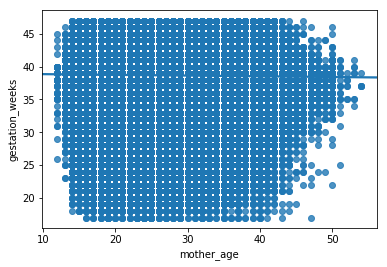

In [148]:
sns.regplot(x="mother_age", y="gestation_weeks", data=df[['mother_age', 'gestation_weeks']])

### 3. heatmap

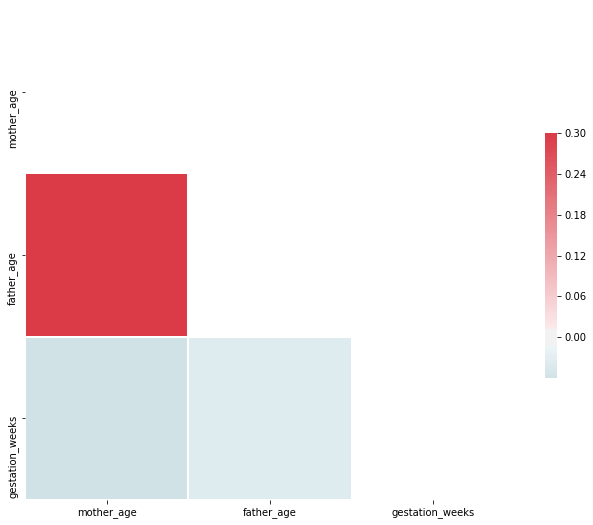

In [149]:
corr = df[['mother_age', 'father_age', 'gestation_weeks']].corr()

mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize=(11, 9))

cmap = sns.diverging_palette(220, 10, as_cmap=True)

sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

## Linear Regression

<img src='lr.png' />

### - 어머니 나이와 임신기간 관의 선형 관계 파악

In [106]:
natality['mother_age'].describe()

count    1.998246e+06
mean     2.688300e+01
std      6.112028e+00
min      1.200000e+01
25%      2.200000e+01
50%      2.700000e+01
75%      3.100000e+01
max      5.400000e+01
Name: mother_age, dtype: float64

In [111]:
# 이상치 확인
natality.query('mother_age < 10 | mother_age > 70')

,weight_pounds,state,year,month,child_race,plurality,mother_race,mother_age,cigarette_use,cigarettes_per_day,alcohol_use,drinks_per_week,father_race,father_age,is_male,gestation_weeks


In [115]:
# null 확인
natality.mother_age.isnull().any()

False

In [116]:
natality.gestation_weeks.describe()

count    1.998246e+06
mean     3.867829e+01
std      2.533674e+00
min      1.700000e+01
25%      3.800000e+01
50%      3.900000e+01
75%      4.000000e+01
max      4.700000e+01
Name: gestation_weeks, dtype: float64

In [86]:
list(racename.values()).index('Black')

1

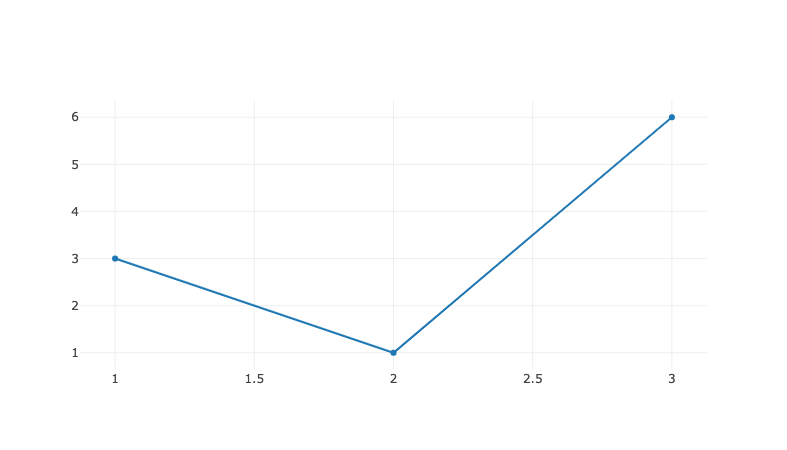

In [20]:
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
iplot([{"x": [1, 2, 3], "y": [3, 1, 6]}])